In [369]:
import pandas as pd
import networkx as nx
import numpy as np
import tqdm
import cartopy.crs as ccrs
from matplotlib import pyplot as plt
import seaborn as sns
import gif
from IPython.display import Image

sns.set_style('darkgrid')

In [212]:
df = pd.read_csv('DOT_04-08-2021 13-14-10-97_panel.csv', low_memory=False)

In [213]:
df.head()

,Country Name,Country Code,Counterpart Country Name,Counterpart Country Code,Time Period,"Goods, Value of Exports, Free on board (FOB), US Dollars (TXG_FOB_USD)",Status,"Goods, Value of Imports, Cost, Insurance, Freight (CIF), US Dollars (TMG_CIF_USD)",Status.1,"Goods, Value of Imports, Free on board (FOB), US Dollars (TMG_FOB_USD)",Status.2,"Goods, Value of Trade Balance, US Dollars (TBG_USD)",Status.3,Unnamed: 13
0,Argentina,213,United States,111,1948,159100000.0,NaN,604000000.0,NaN,NaN,NaN,-444900000.0,NaN,NaN
1,Argentina,213,United States,111,1952,161500000.0,NaN,229900000.0,NaN,NaN,NaN,-68400000.0,NaN,NaN
2,Argentina,213,United States,111,1953,181300000.0,NaN,123900000.0,NaN,NaN,NaN,57400000.0,NaN,NaN
3,Argentina,213,United States,111,1954,122400000.0,NaN,141200000.0,NaN,NaN,NaN,-18800000.0,NaN,NaN
4,Argentina,213,United States,111,1955,118300000.0,NaN,154300000.0,NaN,NaN,NaN,-36000000.0,NaN,NaN


In [214]:
weight = 'Goods, Value of Imports, Cost, Insurance, Freight (CIF), US Dollars (TMG_CIF_USD)'

In [215]:
imf_code = pd.read_excel('co.xlsx', header=1)['IMF Code']

In [222]:
df = df.loc[df['Country Code'].isin(imf_code)]
df = df.loc[df['Counterpart Country Code'].isin(imf_code)]

In [223]:
ave_ks = {}
n_nodes = {}
for year in tqdm.tqdm(sorted(df['Time Period'].unique())):
    G = nx.from_pandas_edgelist(
        df.loc[df['Time Period'] == year],
        source='Country Code',
        target='Counterpart Country Code',
        edge_attr=weight)
    ave_ks[year] = np.average([x[1] for x in G.degree])
    n_nodes[year] = G.number_of_nodes()

100%|██████████████████████████████████████████████████████████████████████████████████| 73/73 [00:02<00:00, 25.08it/s]


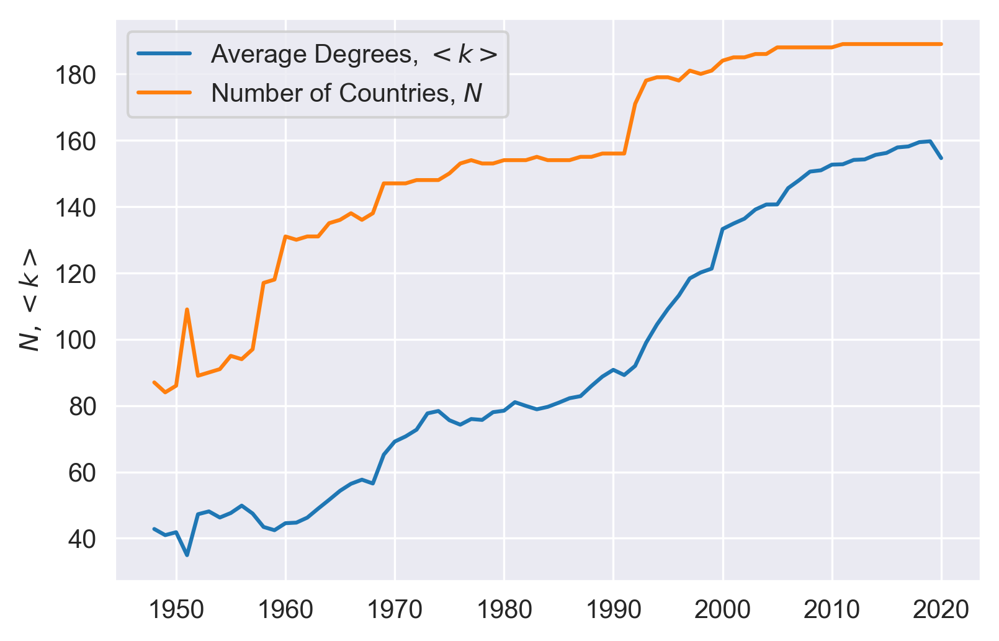

In [224]:
fig, ax = plt.subplots(dpi=300)
ax.plot(pd.Series(ave_ks), label='Average Degrees, $<k>$')
ax.plot(pd.Series(n_nodes), label='Number of Countries, $N$')
ax.legend()
ax.set_ylabel('$N, <k>$')
fig.savefig('temp.png', transparent=True)

<AxesSubplot:xlabel='Time Period'>

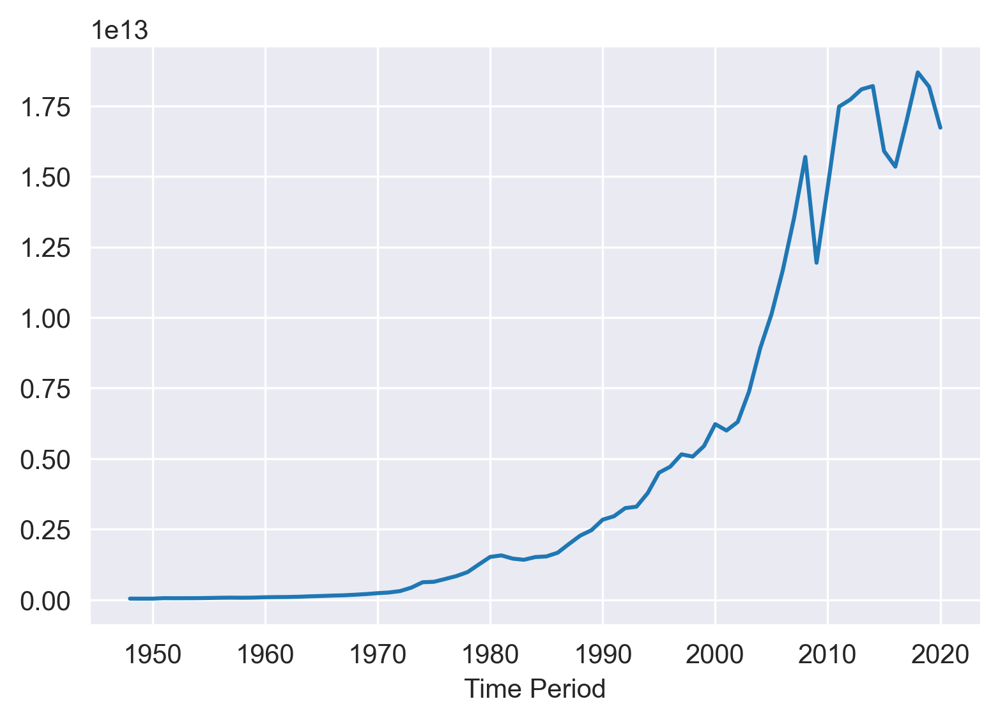

In [225]:
fig, ax = plt.subplots(dpi=300)
df.groupby('Time Period')['Goods, Value of Exports, Free on board (FOB), US Dollars (TXG_FOB_USD)'].sum().plot()

In [226]:
imf = imf_code = pd.read_excel('co.xlsx', header=1)
imf2iso = imf[['IMF Code', 'ISO Code']].set_index('IMF Code').squeeze().to_dict()
imf2iso

{512: 'AFG',
 914: 'ALB',
 612: 'DZA',
 614: 'AGO',
 311: 'ATG',
 213: 'ARG',
 911: 'ARM',
 193: 'AUS',
 122: 'AUT',
 912: 'AZE',
 313: 'BHS',
 419: 'BHR',
 513: 'BGD',
 316: 'BRB',
 913: 'BLR',
 124: 'BEL',
 339: 'BLZ',
 638: 'BEN',
 514: 'BTN',
 218: 'BOL',
 963: 'BIH',
 616: 'BWA',
 223: 'BRA',
 516: 'BRN',
 918: 'BGR',
 748: 'BFA',
 618: 'BDI',
 624: 'CPV',
 522: 'KHM',
 622: 'CMR',
 156: 'CAN',
 626: 'CAF',
 628: 'TCD',
 228: 'CHL',
 924: 'CHN',
 233: 'COL',
 632: 'COM',
 636: 'COD',
 634: 'COG',
 238: 'CRI',
 662: 'CIV',
 960: 'HRV',
 423: 'CYP',
 935: 'CZE',
 128: 'DNK',
 611: 'DJI',
 321: 'DMA',
 243: 'DOM',
 248: 'ECU',
 469: 'EGY',
 253: 'SLV',
 642: 'GNQ',
 643: 'ERI',
 939: 'EST',
 644: 'ETH',
 819: 'FJI',
 172: 'FIN',
 132: 'FRA',
 646: 'GAB',
 648: 'GMB',
 915: 'GEO',
 134: 'DEU',
 652: 'GHA',
 174: 'GRC',
 328: 'GRD',
 258: 'GTM',
 656: 'GIN',
 654: 'GNB',
 336: 'GUY',
 263: 'HTI',
 268: 'HND',
 532: 'HKG',
 944: 'HUN',
 176: 'ISL',
 534: 'IND',
 536: 'IDN',
 429: 'IRN',

In [251]:
pd.read_csv('countries_codes_and_coordinates.csv').iloc[:10]

,Country,Alpha-2 code,Alpha-3 code,Numeric code,Latitude (average),Longitude (average)
0,Afghanistan,AF,AFG,4,33.0000,65.0000
1,Albania,AL,ALB,8,41.0000,20.0000
2,Algeria,DZ,DZA,12,28.0000,3.0000
3,American Samoa,AS,ASM,16,-14.3333,-170.0000
4,Andorra,AD,AND,20,42.5000,1.6000
5,Angola,AO,AGO,24,-12.5000,18.5000
6,Anguilla,AI,AIA,660,18.2500,-63.1667
7,Antarctica,AQ,ATA,10,-90.0000,0.0000
8,Antigua and Barbuda,AG,ATG,28,17.0500,-61.8000
9,Argentina,AR,ARG,32,-34.0000,-64.0000


In [263]:
ref = pd.read_csv('countries_codes_and_coordinates.csv').iloc[:, 1:]
ref['Alpha-3 code'] = ref['Alpha-3 code'].str.strip()
iso2coor = ref.set_index('Alpha-3 code')[['Latitude (average)', 'Longitude (average)']].to_dict('index')
iso2coor['KOS'] = {'Latitude (average)': 42.6026, 'Longitude (average)': 20.9030}
iso2coor['ROM'] = iso2coor['ROU']
iso2coor

{'AFG': {'Latitude (average)': 33.0, 'Longitude (average)': 65.0},
 'ALB': {'Latitude (average)': 41.0, 'Longitude (average)': 20.0},
 'DZA': {'Latitude (average)': 28.0, 'Longitude (average)': 3.0},
 'ASM': {'Latitude (average)': -14.3333, 'Longitude (average)': -170.0},
 'AND': {'Latitude (average)': 42.5, 'Longitude (average)': 1.6},
 'AGO': {'Latitude (average)': -12.5, 'Longitude (average)': 18.5},
 'AIA': {'Latitude (average)': 18.25, 'Longitude (average)': -63.1667},
 'ATA': {'Latitude (average)': -90.0, 'Longitude (average)': 0.0},
 'ATG': {'Latitude (average)': 17.05, 'Longitude (average)': -61.8},
 'ARG': {'Latitude (average)': -34.0, 'Longitude (average)': -64.0},
 'ARM': {'Latitude (average)': 40.0, 'Longitude (average)': 45.0},
 'ABW': {'Latitude (average)': 12.5, 'Longitude (average)': -69.9667},
 'AUS': {'Latitude (average)': -27.0, 'Longitude (average)': 133.0},
 'AUT': {'Latitude (average)': 47.3333, 'Longitude (average)': 13.3333},
 'AZE': {'Latitude (average)': 40.5,

In [262]:
ref.loc[pd.read_csv('countries_codes_and_coordinates.csv')['Country'] == 'Romania']

,Alpha-2 code,Alpha-3 code,Numeric code,Latitude (average),Longitude (average)
179,RO,ROU,642,46.0,25.0


In [256]:
df.loc[df['Country Code']==967]

,Country Name,Country Code,Counterpart Country Name,Counterpart Country Code,Time Period,"Goods, Value of Exports, Free on board (FOB), US Dollars (TXG_FOB_USD)",Status,"Goods, Value of Imports, Cost, Insurance, Freight (CIF), US Dollars (TMG_CIF_USD)",Status.1,"Goods, Value of Imports, Free on board (FOB), US Dollars (TMG_FOB_USD)",Status.2,"Goods, Value of Trade Balance, US Dollars (TBG_USD)",Status.3,Unnamed: 13
846484,"Kosovo, Rep. of",967,Romania,968,2007,344721.0,NaN,25575445.0,NaN,NaN,NaN,-25230724.0,NaN,NaN
846485,"Kosovo, Rep. of",967,Romania,968,2008,447527.0,NaN,33295948.0,NaN,NaN,NaN,-32848421.0,NaN,NaN
846486,"Kosovo, Rep. of",967,Romania,968,2009,354569.0,NaN,31984254.0,NaN,NaN,NaN,-31629685.0,NaN,NaN
846487,"Kosovo, Rep. of",967,Romania,968,2010,592815.0,NaN,33583316.0,NaN,NaN,NaN,-32990501.0,NaN,NaN
846488,"Kosovo, Rep. of",967,Romania,968,2011,676188.0,NaN,40905844.0,NaN,NaN,NaN,-40229656.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
848369,"Kosovo, Rep. of",967,United States,111,2016,2000509.0,NaN,61632523.0,NaN,NaN,NaN,-59632014.0,NaN,NaN
848370,"Kosovo, Rep. of",967,United States,111,2017,2721365.0,NaN,40403360.0,NaN,NaN,NaN,-37681995.0,NaN,NaN
848371,"Kosovo, Rep. of",967,United States,111,2018,2734248.0,NaN,41966923.0,NaN,NaN,NaN,-39232675.0,NaN,NaN
848372,"Kosovo, Rep. of",967,United States,111,2019,3535961.0,NaN,51654442.0,NaN,NaN,NaN,-48118481.0,NaN,NaN


In [243]:
df

,Country Name,Country Code,Counterpart Country Name,Counterpart Country Code,Time Period,"Goods, Value of Exports, Free on board (FOB), US Dollars (TXG_FOB_USD)",Status,"Goods, Value of Imports, Cost, Insurance, Freight (CIF), US Dollars (TMG_CIF_USD)",Status.1,"Goods, Value of Imports, Free on board (FOB), US Dollars (TMG_FOB_USD)",Status.2,"Goods, Value of Trade Balance, US Dollars (TBG_USD)",Status.3,Unnamed: 13
0,Argentina,213,United States,111,1948,1.591000e+08,NaN,604000000.0,NaN,NaN,NaN,-4.449000e+08,NaN,NaN
1,Argentina,213,United States,111,1952,1.615000e+08,NaN,229900000.0,NaN,NaN,NaN,-6.840000e+07,NaN,NaN
2,Argentina,213,United States,111,1953,1.813000e+08,NaN,123900000.0,NaN,NaN,NaN,5.740000e+07,NaN,NaN
3,Argentina,213,United States,111,1954,1.224000e+08,NaN,141200000.0,NaN,NaN,NaN,-1.880000e+07,NaN,NaN
4,Argentina,213,United States,111,1955,1.183000e+08,NaN,154300000.0,NaN,NaN,NaN,-3.600000e+07,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1585003,Zambia,754,"Slovenia, Rep. of",961,2017,2.254000e+03,NaN,3292870.0,NaN,NaN,NaN,-3.290616e+06,NaN,NaN
1585004,Zambia,754,"Slovenia, Rep. of",961,2018,1.325000e+03,NaN,148712.0,NaN,NaN,NaN,-1.473870e+05,NaN,NaN
1585005,Zambia,754,"Slovenia, Rep. of",961,2019,1.865000e+03,NaN,1986776.0,NaN,NaN,NaN,-1.984911e+06,NaN,NaN
1585006,Zambia,754,"Slovenia, Rep. of",961,2020,NaN,NaN,154876.0,NaN,NaN,NaN,-1.548760e+05,NaN,NaN


In [267]:
records = []
for record in tqdm.tqdm(df.to_dict('records')):
    records.append({
        'year': record['Time Period'],
        'source': imf2iso[record['Country Code']],
        'target': imf2iso[record['Counterpart Country Code']],
        'weight': record['Goods, Value of Exports, Free on board (FOB), US Dollars (TXG_FOB_USD)'],
        'source_coor': iso2coor[imf2iso[record['Country Code']]],
        'target_coor': iso2coor[imf2iso[record['Counterpart Country Code']]],
    })

100%|██████████████████████████████████████████████████████████████████████| 993690/993690 [00:03<00:00, 306573.14it/s]


In [285]:
df_records = pd.DataFrame(records)
df_records

,year,source,target,weight,source_coor,target_coor
0,1948,ARG,USA,1.591000e+08,"{'Latitude (average)': -34.0, 'Longitude (aver...","{'Latitude (average)': 38.0, 'Longitude (avera..."
1,1952,ARG,USA,1.615000e+08,"{'Latitude (average)': -34.0, 'Longitude (aver...","{'Latitude (average)': 38.0, 'Longitude (avera..."
2,1953,ARG,USA,1.813000e+08,"{'Latitude (average)': -34.0, 'Longitude (aver...","{'Latitude (average)': 38.0, 'Longitude (avera..."
3,1954,ARG,USA,1.224000e+08,"{'Latitude (average)': -34.0, 'Longitude (aver...","{'Latitude (average)': 38.0, 'Longitude (avera..."
4,1955,ARG,USA,1.183000e+08,"{'Latitude (average)': -34.0, 'Longitude (aver...","{'Latitude (average)': 38.0, 'Longitude (avera..."
...,...,...,...,...,...,...
993685,2017,ZMB,SVN,2.254000e+03,"{'Latitude (average)': -15.0, 'Longitude (aver...","{'Latitude (average)': 46.0, 'Longitude (avera..."
993686,2018,ZMB,SVN,1.325000e+03,"{'Latitude (average)': -15.0, 'Longitude (aver...","{'Latitude (average)': 46.0, 'Longitude (avera..."
993687,2019,ZMB,SVN,1.865000e+03,"{'Latitude (average)': -15.0, 'Longitude (aver...","{'Latitude (average)': 46.0, 'Longitude (avera..."
993688,2020,ZMB,SVN,NaN,"{'Latitude (average)': -15.0, 'Longitude (aver...","{'Latitude (average)': 46.0, 'Longitude (avera..."


In [409]:
arr = df_records.weight.values
thresh = {
    1: arr > 2_000_000_000,
    0.5: (arr > 500_000_000) * (arr <= 2_000_000_000),
    0.3: (arr > 150_000_000) * (arr <= 500_000_000),
    0.1: (arr >= 50_000_000) * (arr <= 150_000_000)
}
df_records['thiccness'] = np.select(thresh.values(), thresh.keys())

In [410]:
pos = {
    cnt: (coor['Longitude (average)'], coor['Latitude (average)']) 
    for cnt, coor in iso2coor.items()}

In [432]:
year = 2019

view = df_records[df_records['year'] == year]
G = nx.from_pandas_edgelist(view, edge_attr='thiccness', create_using=nx.DiGraph)


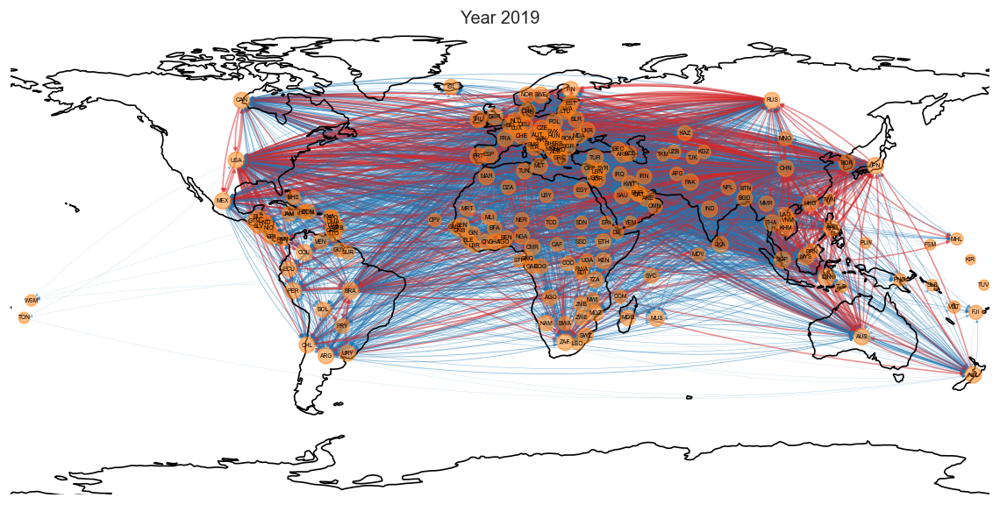

In [433]:
crs = ccrs.PlateCarree()
fig, ax = plt.subplots(
    figsize=(12, 8), dpi=120, subplot_kw=dict(projection=crs))
ax.coastlines()
ax.set_extent([-180, -180, -85, 85])

edgedict = {
    (x, y): z['thiccness'] 
    for x, y, z 
    in G.edges(data=True) 
    if z['thiccness']
}
edge_color = ['tab:Blue' if t< 1 else 'tab:red' for x, t in edgedict.items()]
node_color = 'tab:Orange'
node_size = [10+0.3*item[1] for item in G.degree()]

nx.draw_networkx_labels(
    G, pos, ax=ax,
    font_size=4
)
nx.draw_networkx_nodes(
    G, pos, ax=ax,
    node_size=node_size,
    node_color=node_color,
    alpha=0.5
)
nx.draw_networkx_edges(
    G, pos, ax=ax,
    edgelist=list(edgedict.keys()),
    width=list(edgedict.values()),
    edge_color=edge_color,
    connectionstyle="arc3,rad=0.1",
    arrowsize=5,
    node_size=node_size,
    alpha=0.5
)
ax.set_title(f'Year {year}')
ax.set_axis_off()

In [427]:
@gif.frame
def frame(year):
    view = df_records[df_records['year'] == year]
    G = nx.from_pandas_edgelist(
        view, edge_attr='thiccness',create_using=nx.DiGraph)
    
    crs = ccrs.PlateCarree()
    fig, ax = plt.subplots(
        figsize=(12, 8), dpi=120, subplot_kw=dict(projection=crs))
    ax.coastlines()
    ax.set_extent([-180, -180, -85, 85])

    edgedict = {
        (x, y): z['thiccness'] 
        for x, y, z 
        in G.edges(data=True) 
        if z['thiccness']
    }
    edge_color = ['tab:Blue' if t< 1 else 'tab:red' for x, t in edgedict.items()]
    node_color = 'tab:Orange'
    node_size = [10+0.3*item[1] for item in G.degree()]

    # nx.draw_networkx_labels(
    #     G, pos, ax=ax,
    #     font_size=4
    # )
    nx.draw_networkx_nodes(
        G, pos, ax=ax,
        node_size=node_size,
        node_color=node_color,
        alpha=0.5
    )
    nx.draw_networkx_edges(
        G, pos, ax=ax,
        edgelist=list(edgedict.keys()),
        width=list(edgedict.values()),
        edge_color=edge_color,
        connectionstyle="arc3,rad=0.1",
        arrowsize=5,
        node_size=node_size,
        alpha=0.5
    )
    ax.set_title(f'Year {year}')
    ax.set_axis_off()

In [428]:
years = sorted(df_records.year.unique())

In [429]:
frames = [frame(year) for year in tqdm.tqdm(years)]
path = 'zawurdo.gif'

100%|██████████████████████████████████████████████████████████████████████████████████| 73/73 [10:51<00:00,  8.93s/it]


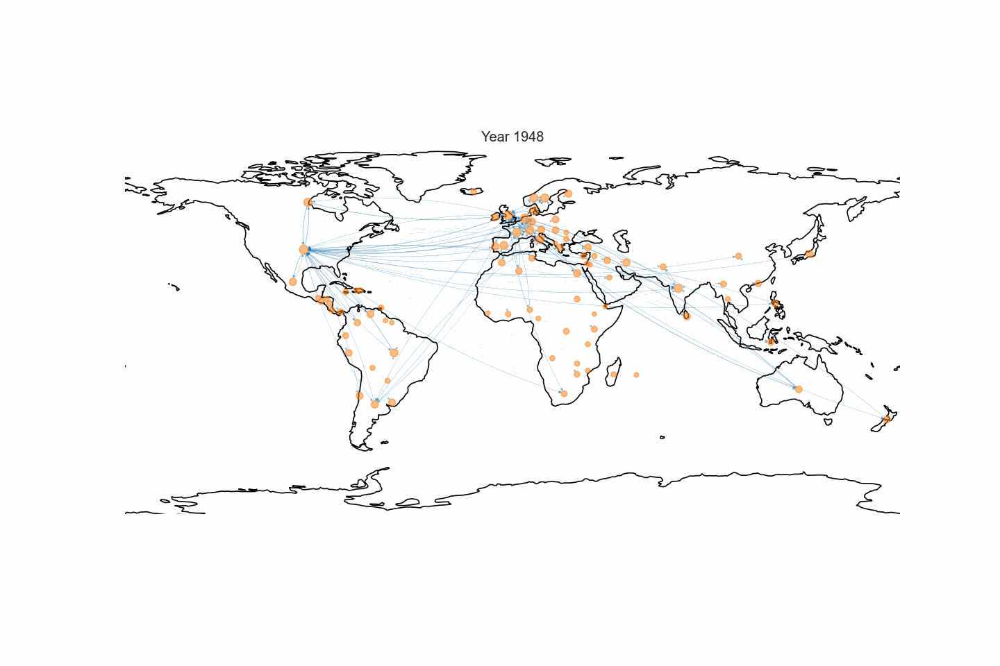

In [430]:
gif.save(frames, path, duration=100)
display(Image(open(path, 'rb').read()))